# UMAPs Neurips samples, NK cells

In this notebook different markers to identify NK cell subpopulations are tested. Markers are collected from Melsen et al., paper (2022). RNA and corresponding surface markers are shown when available. Protein expression levels within a cell are normalized using the centered-log ratio (CLR) transformation. UMAPs are generated from latent space. 

Reference: 
Melsen, J. E., van Ostaijen-Ten Dam, M. M., Schoorl, D. J. A., Schol, P. J., van den Homberg, D. A. L., Lankester, A. C., Lugthart, G., & Schilham, M. W. (2022). Single-cell transcriptomics in bone marrow delineates CD56dimGranzymeK+ subset as intermediate stage in NK cell differentiation. Frontiers in immunology, 13, 1044398. https://doi.org/10.3389/fimmu.2022.1044398

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import anndata as ad
import scvi
import scanpy as sc
import umap

from ridgeplot import ridgeplot

import warnings

warnings.filterwarnings('ignore')



Global seed set to 0
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/Users/tiinatuononen/opt/anaconda3/envs/tiina-env/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [2]:
#Neurips

adata = sc.read_h5ad('/Users/tiinatuononen/Desktop/Thesis/Project/data/adata_neurips_norm_outer.h5ad')

In [3]:
adata = adata.copy()

In [4]:
#Both NK cell types selected  + one sample is selected

adata = adata[(adata.obs['cell_type'] == "NK") | (adata.obs['cell_type'] == "NK CD158e1+")]

In [8]:
#Selecting only one sample

adata =adata[adata.obs['POOL'] == "s4d1"]

In [9]:
neurips_nk_prot = adata.obsm['protein_expression_clr_neurips']

In [10]:
prot=adata.obsm['protein_expression_clr_neurips']

In [11]:
#some proteins and genes have same names, here _prot added after protein names
prot=prot.rename(columns={'CD2': 'CD2_prot', 'CX3CR1': 'CX3CR1_prot', 'CD226':'CD226_prot', 'TIGIT':'TIGIT_prot', 'CD27':'CD27_prot', 'CD38': 'CD38_prot', 'CD224': 'CD224_prot', 'CD7': 'CD7_prot', 'CD44': 'CD44_prot', 'CD34': 'CD34_prot','CD5': 'CD5_prot'})


In [12]:
#adding protein information to obs

a = adata.obs
b = prot

adata_eg=pd.concat([a, b], axis=1)
adata.obs=adata_eg


In [17]:
#Calculate neigbors using latent space coordinates

sc.pp.neighbors(adata, use_rep="X_totalVI")   
sc.tl.umap(adata)

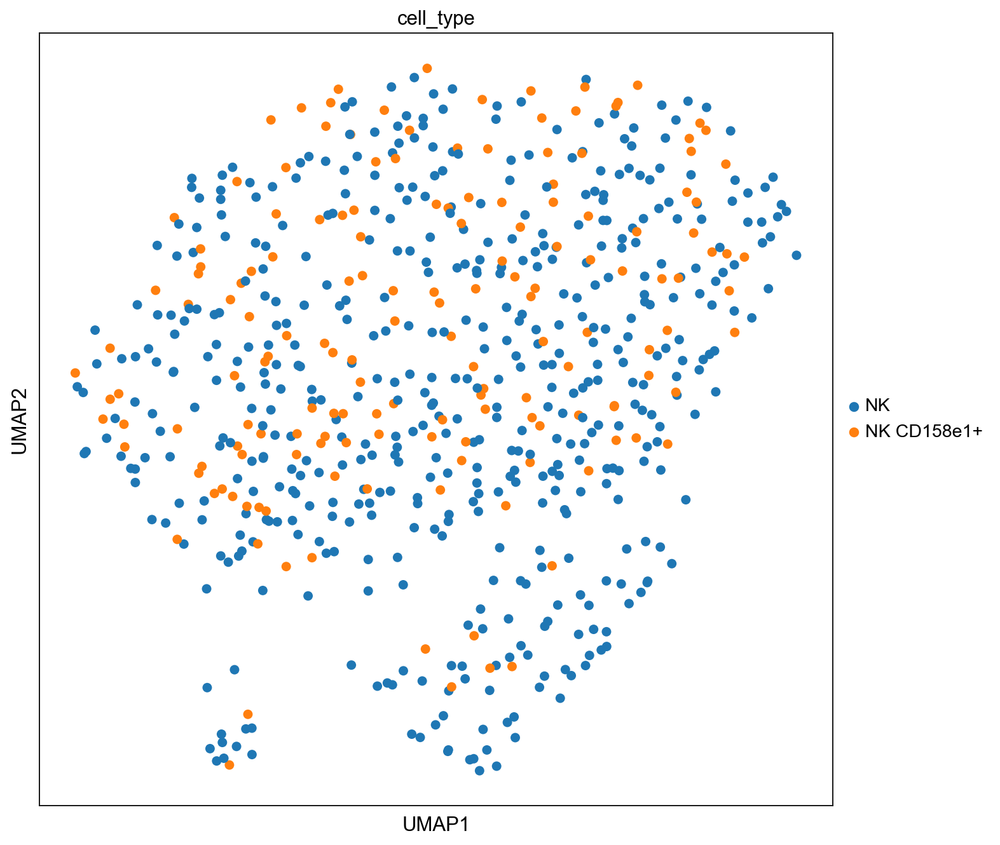

In [19]:
# NK cells from Neurips dataset, coloured by cell type

sc.set_figure_params(figsize=(10, 10))

sc.pl.umap(adata, color = ['cell_type'])

## Markers by Melsen et al.

- scRNA-seq on bone marrow. 
- CD56, CXCR6, CD117 and CD34 oligonucleotide-conjugated antibodies were used
- healthy donors, 1 BM transplant recipient


### 8 NK cell cluster were defined: #

1. Mature CD56dim NK cells (83% of all cells)
2. lymhphoid tissue-resident (lt) CXCR6+ NK cells (4%) 
3. CD34+ (progenitors?) (1.9%)
4. immature CD56bright NK cells (
5. non-cytotoxic innate lymphoid cells (ILCs)
6. proliferating NK cells
7. Mature CD56dim NK cells (3.4% of all cells)
8. CD56- and CD16+ NK cells with reduced effector function


### Markers: #

1. GZMK-, S100A4, S100A6, ACTB, ACTG1, CORO1A, PFN1. 
2. CCL3, CCL4, XCL1, GZMK, CD160, DUSP2, CXCR4, BTG1
3. Mainly defined by absence of CCL5, CD117+
4. SELL (CD62L), CD2, CD117, IL7R, high expression of KLRC1, CD56bright
5. Absence of NKG7, high expression of IL7R, high expression of FGFBP2, PRSS23
6. Upregulated cell cycle genes, high S100A4, S100A6, KLRC2. Upregulation of IL32, GZMH and GNLY, and downregulation of KLRC1, KLRB1 (CD161) and CD160
7. GZMK+, higher expression of SELL (CD62L) and lower expression of GZMB, PRF1 and PCGR3A (CD16) compared to cluster 1. Intermediate stage between CD56bright and CD56dim? 
8. Express NKG7 and FCGR3A, but had low expression of PRF1 and GZMB. CD56-, CD16+. 


- Generally, inhibitory KIRs more frequently expressed in terminally differentiated cells, but in this study were not in top5 DE genes. 
- When comparing to other datasets,  CD56- NK cells not found (probably donor specific). The CD34+ and ltNK cells were barely detected in blood (likely bone-marrow resident). 
- New identified cluster 2, CD56dim GZMK+. Likely intermediate state between CD56bright and CD56dim
- pseudotime analysis of terminally differentiated cells : FGFBP2, PRF1,GZMB, GZMK. Shift from granzyme K to granzyme B during differentiation. 

In [ ]:
#Used to check which markers were measured in Neurips


#listOfmarkers= ['CD160']


#for x in listOfmarkers:
#    if x in prot.columns:
#        print(x)


In [20]:
sample_nk = adata

## 1. CD56bright immature NK cells (cluster 4 in the paper)

CD56bright NK cells, RNA


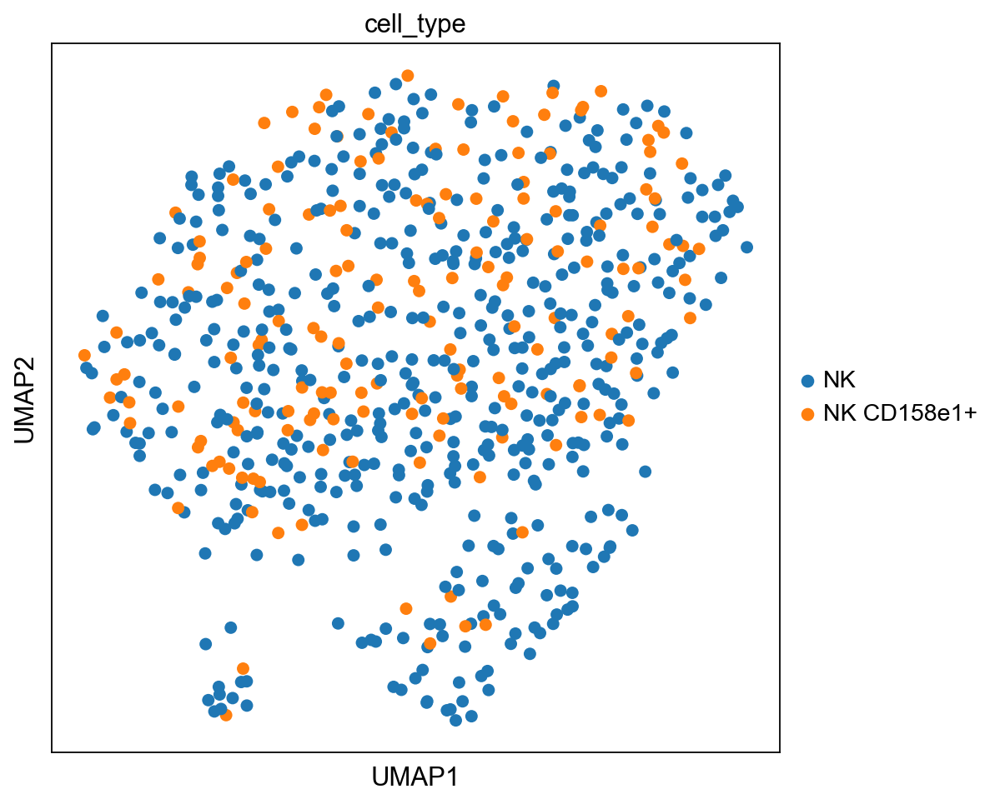

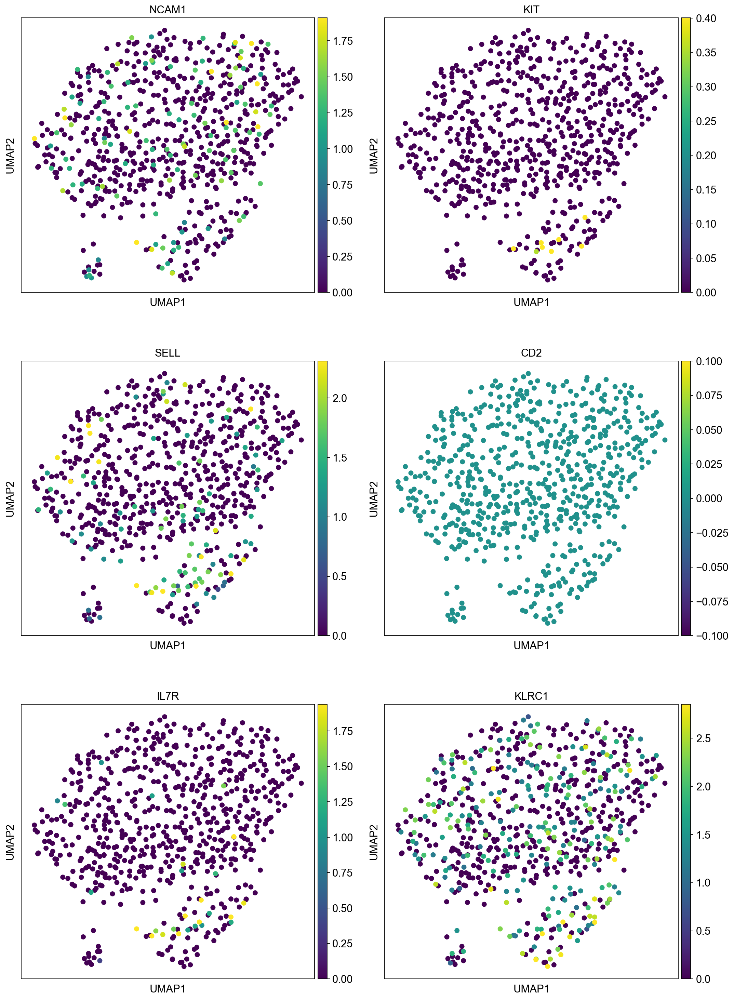

CD56bright NK cells, proteins,  NCAM1= CD56, KIT = CD117, SELL = CD62L, IL7R = CD127


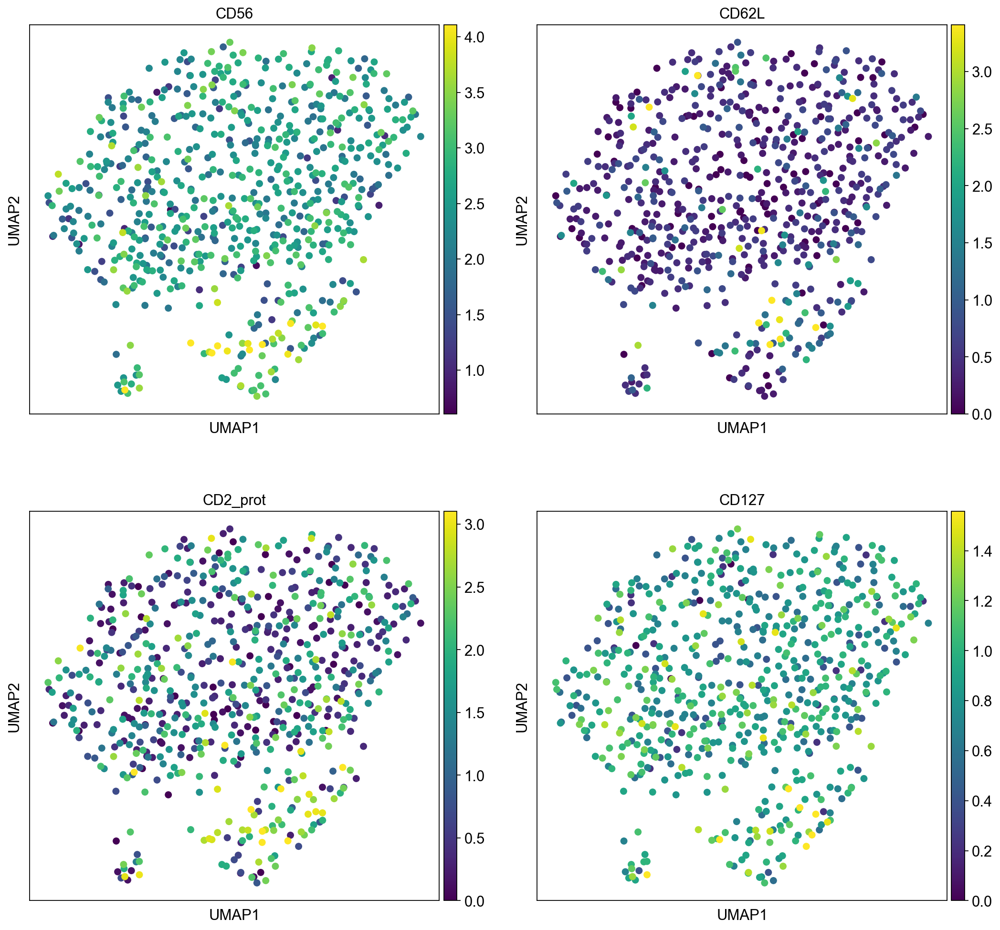

In [21]:
cd56bright_mels = ['NCAM1', 'KIT', 'SELL', 'CD2', 'IL7R', 'KLRC1']

cd56bright_mels_prot= ['CD56', 'CD62L', "CD2_prot", 'CD127']  #CD117 ab not used in this dataset

sc.set_figure_params(figsize=(7, 7))

#RNA
print("CD56bright NK cells, RNA")

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

sc.pl.umap(sample_nk, color = cd56bright_mels, vmax="p99", color_map = 'viridis', ncols=2)

#Surface protein
print("CD56bright NK cells, proteins,  NCAM1= CD56, KIT = CD117, SELL = CD62L, IL7R = CD127")

sc.pl.umap(sample_nk, color = cd56bright_mels_prot, vmax="p99", color_map = 'viridis', ncols=2)



## 2. CD56dim NK cells (clusters 1 and 7 in the paper)

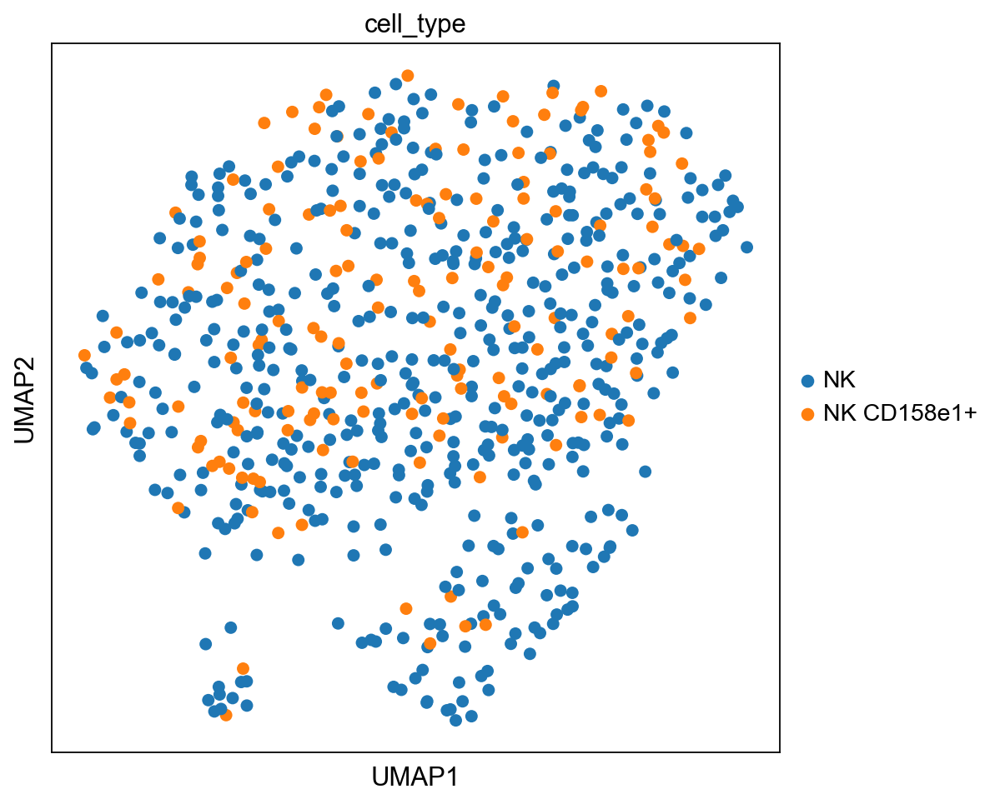

CD56dim NK cells, cluster 1, high expression, RNA


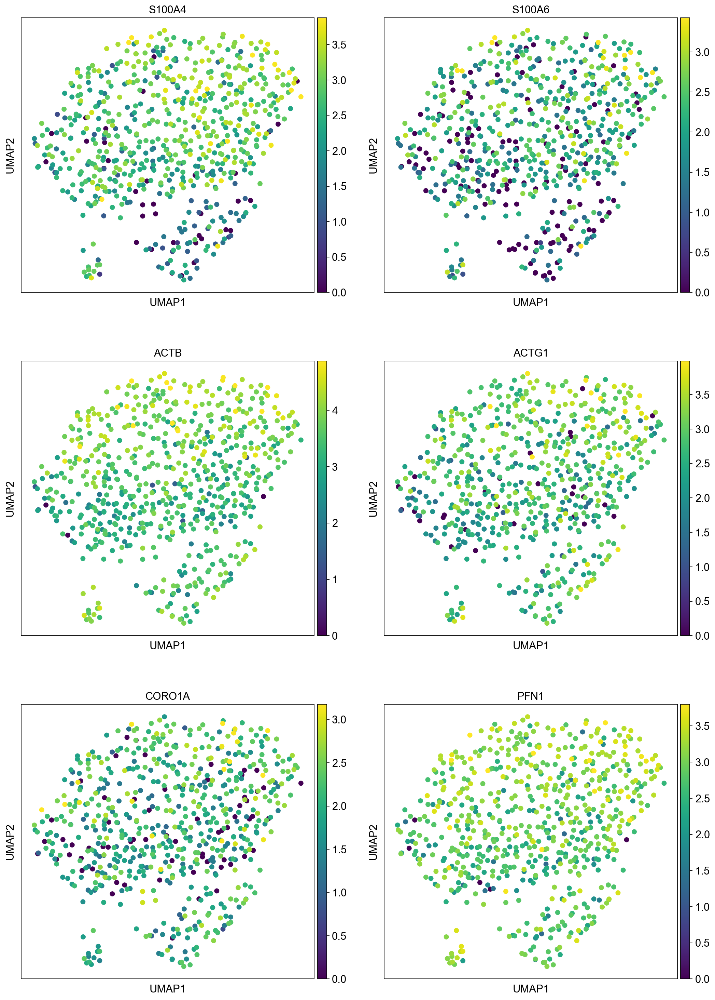

CD56dim NK cells, cluster 1, low expression, RNA


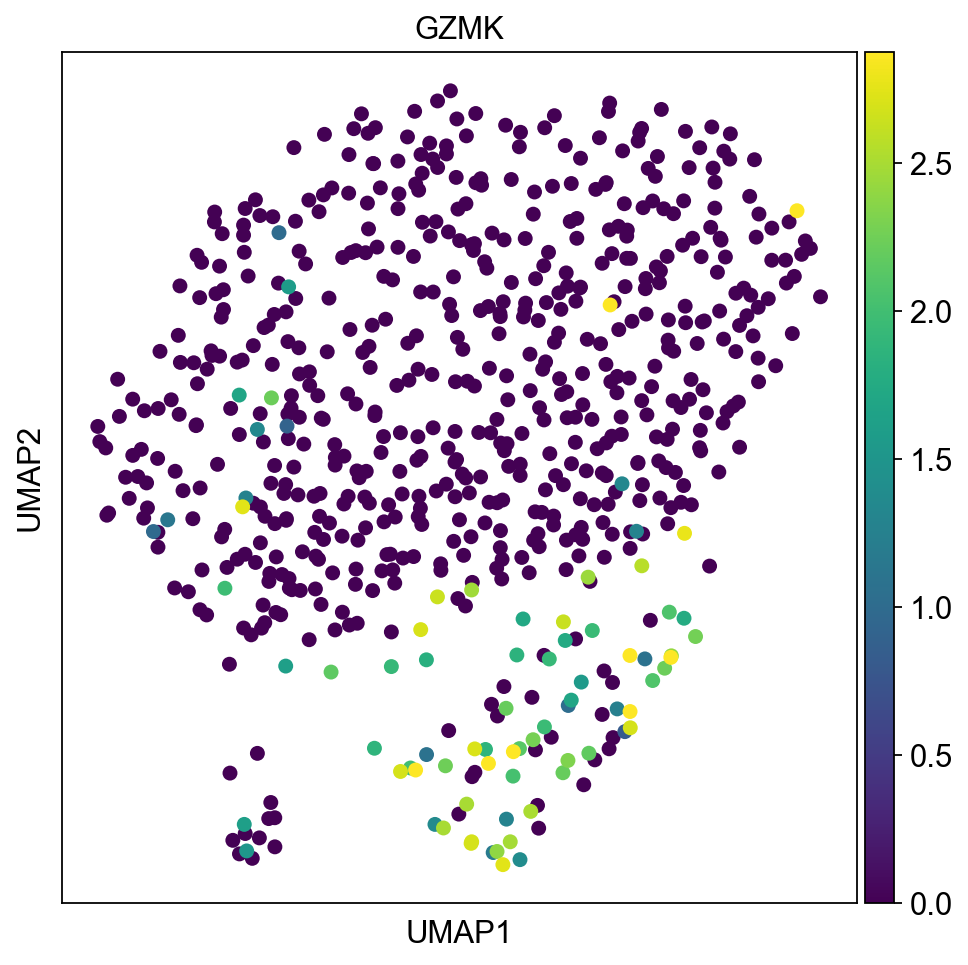

CD56dim NK cells, cluster 7, high expression, RNA


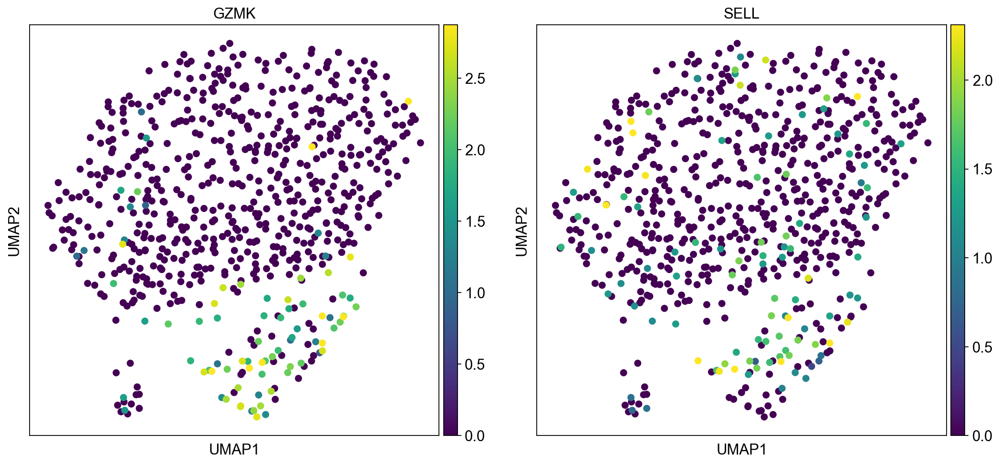

CD56dim NK cells, cluster 7, low expression, RNA


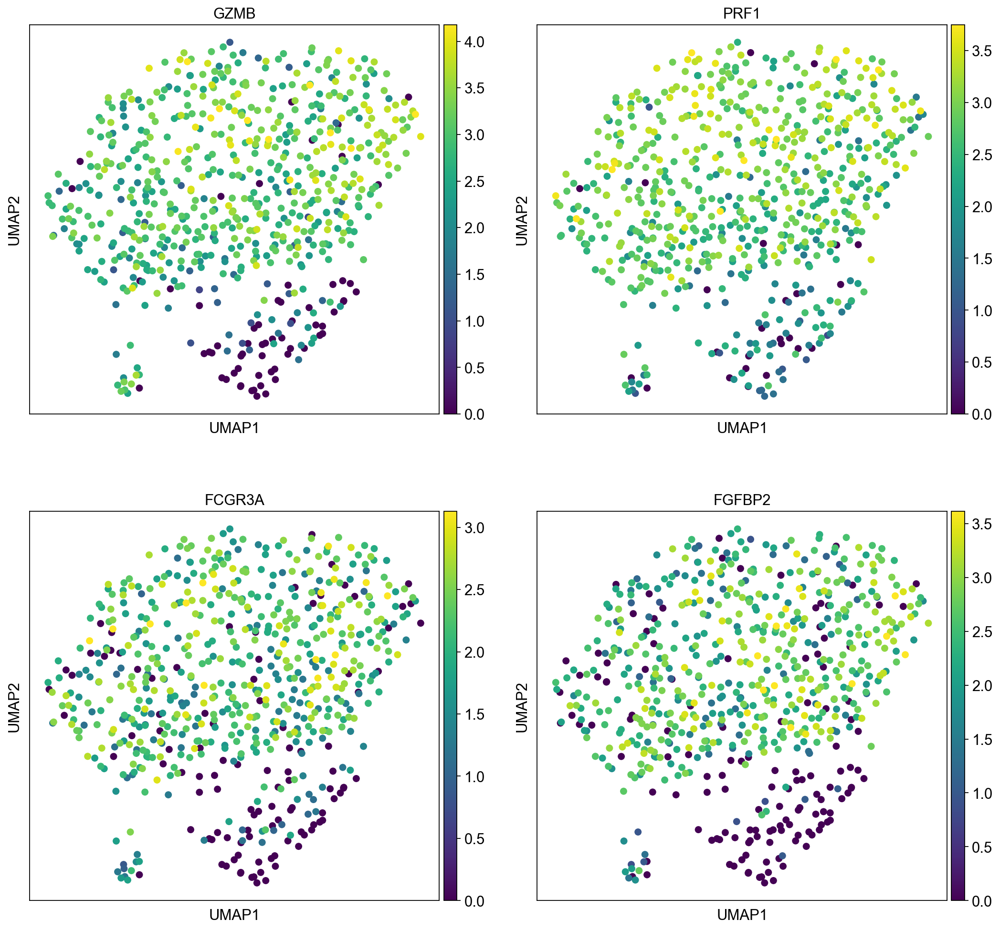

CD56dim NK cells, cluster 7, high protein, FCGR3A=CD16


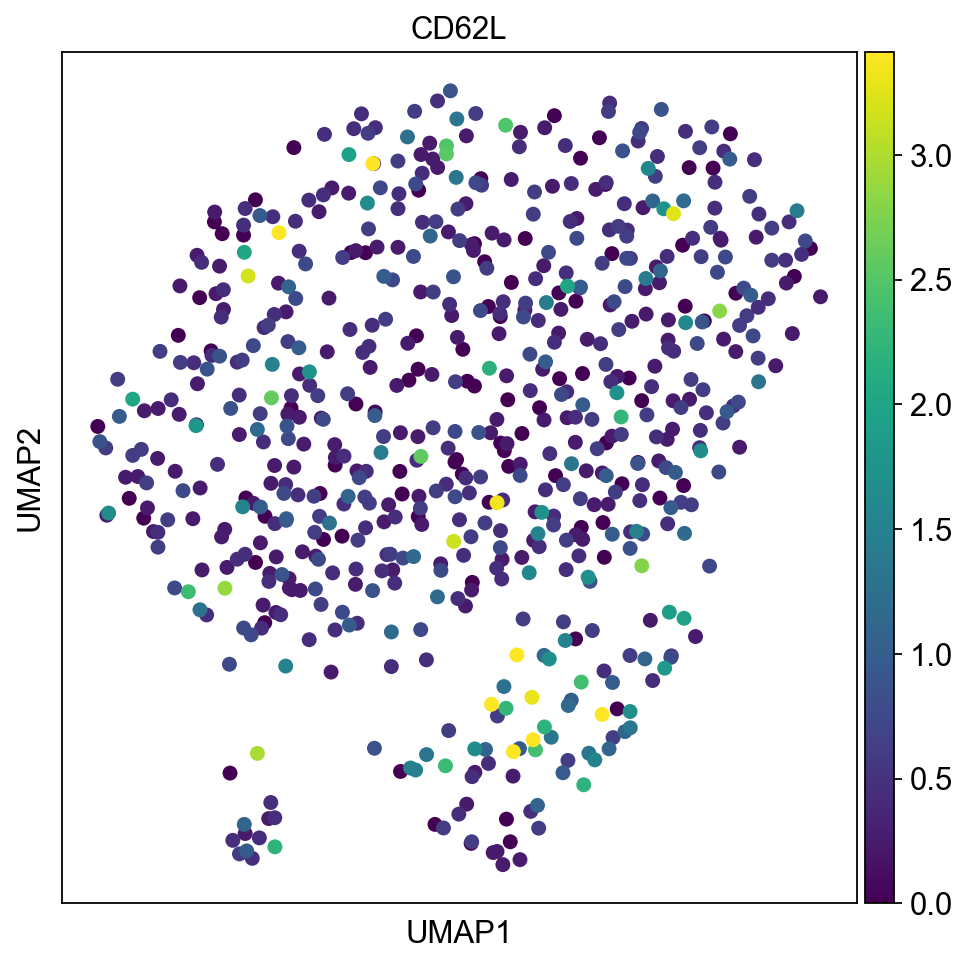

CD56dim NK cells, cluster 7, low protein, SELL=CD62L


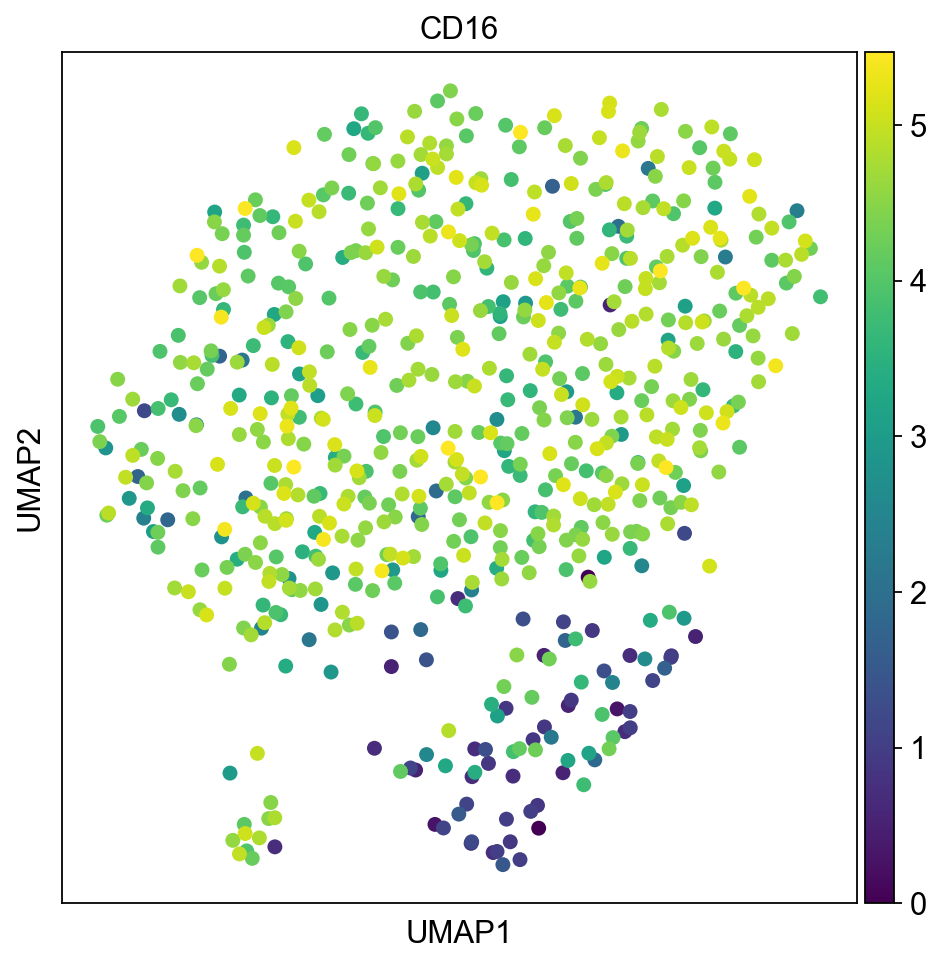

In [22]:
#cluster 1

cd56dim_1_high= ['S100A4', 'S100A6', 'ACTB', 'ACTG1', 'CORO1A', 'PFN1']
cd56dim_1_low = ['GZMK']

#cluster 7 (suggested to be intermediate stage between CD56bright and CD56dim NK cells)

cd56dim_7_high = ['GZMK', 'SELL'] #higher expression compared to cluster 1
cd56dim_7_low = ['GZMB', 'PRF1', 'FCGR3A', 'FGFBP2'] #lower expression compared to cluster 1
cd56dim_7_high_prot = ['CD62L']
cd56dim_7_low_prot =['CD16']

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#Cluster 1

print('CD56dim NK cells, cluster 1, high expression, RNA')
sc.pl.umap(sample_nk, color = cd56dim_1_high, vmax="p99", color_map = 'viridis', ncols=2)

print('CD56dim NK cells, cluster 1, low expression, RNA')
sc.pl.umap(sample_nk, color = cd56dim_1_low, vmax="p99", color_map = 'viridis', ncols=2)

#Cluster 7

print('CD56dim NK cells, cluster 7, high expression, RNA')
sc.pl.umap(sample_nk, color = cd56dim_7_high, vmax="p99", color_map = 'viridis', ncols=2)

print('CD56dim NK cells, cluster 7, low expression, RNA')
sc.pl.umap(sample_nk, color = cd56dim_7_low, vmax="p99", color_map = 'viridis', ncols=2)

print("CD56dim NK cells, cluster 7, high protein, FCGR3A=CD16")

sc.pl.umap(sample_nk, color = cd56dim_7_high_prot, vmax="p99", color_map = 'viridis', ncols=2)

print("CD56dim NK cells, cluster 7, low protein, SELL=CD62L")
sc.pl.umap(sample_nk, color = cd56dim_7_low_prot, vmax="p99", color_map = 'viridis', ncols=2)

## 3. Tissue resident NK cells (cluster 2 in the paper)

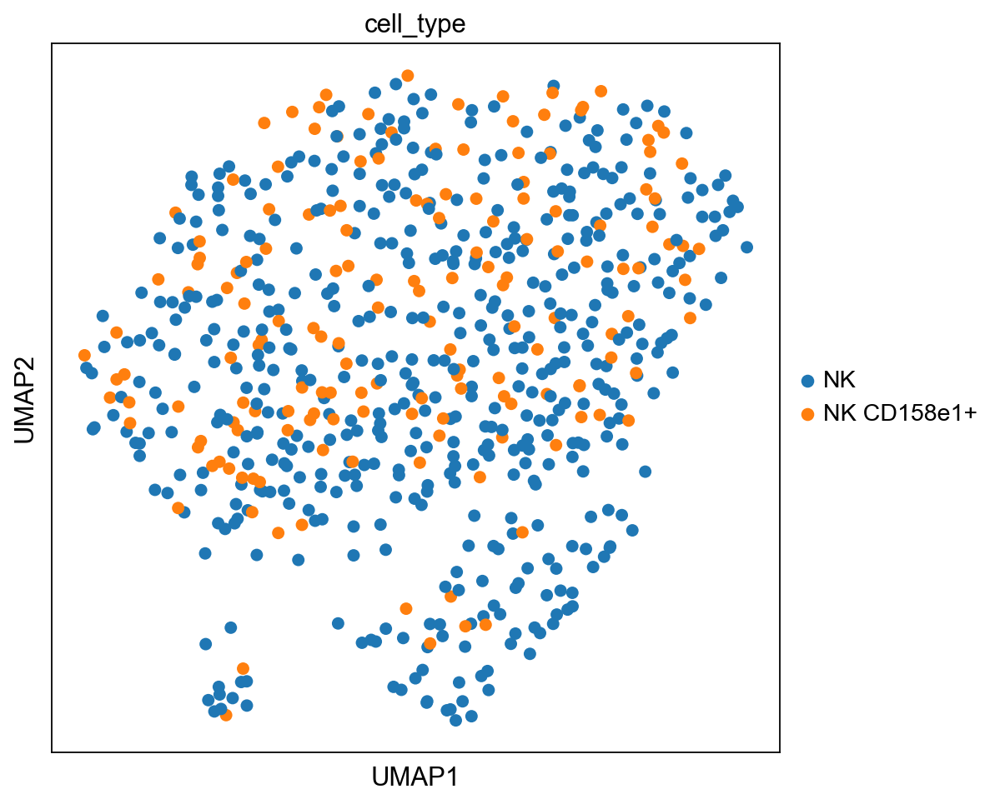

lymphoid tissue-resident NK cells, RNA


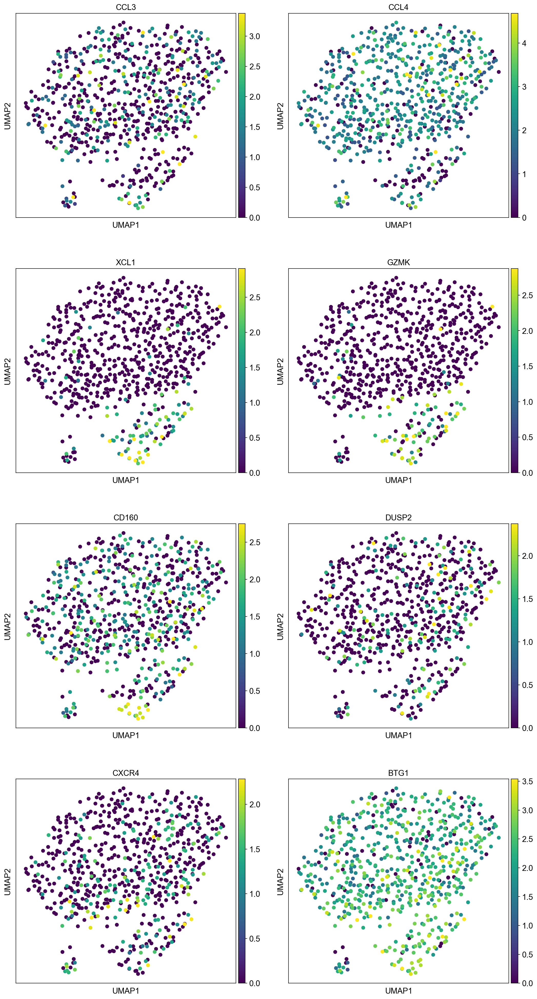

In [23]:
tr_mels= ['CCL3', 'CCL4', 'XCL1', 'GZMK', 'CD160', 'DUSP2', 'CXCR4', 'BTG1']
# No corresponding surface markers 


sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#RNA
print('lymphoid tissue-resident NK cells, RNA')
sc.pl.umap(sample_nk, color = tr_mels, vmax="p99", color_map = 'viridis', ncols=2)


- based on these markers difficult to evaluate the localization of the lt-NK cells on the UMAP. 

## 3. Non-cytotoxic innate lymphoid cells (ILCs, cluster 5 in the paper) 

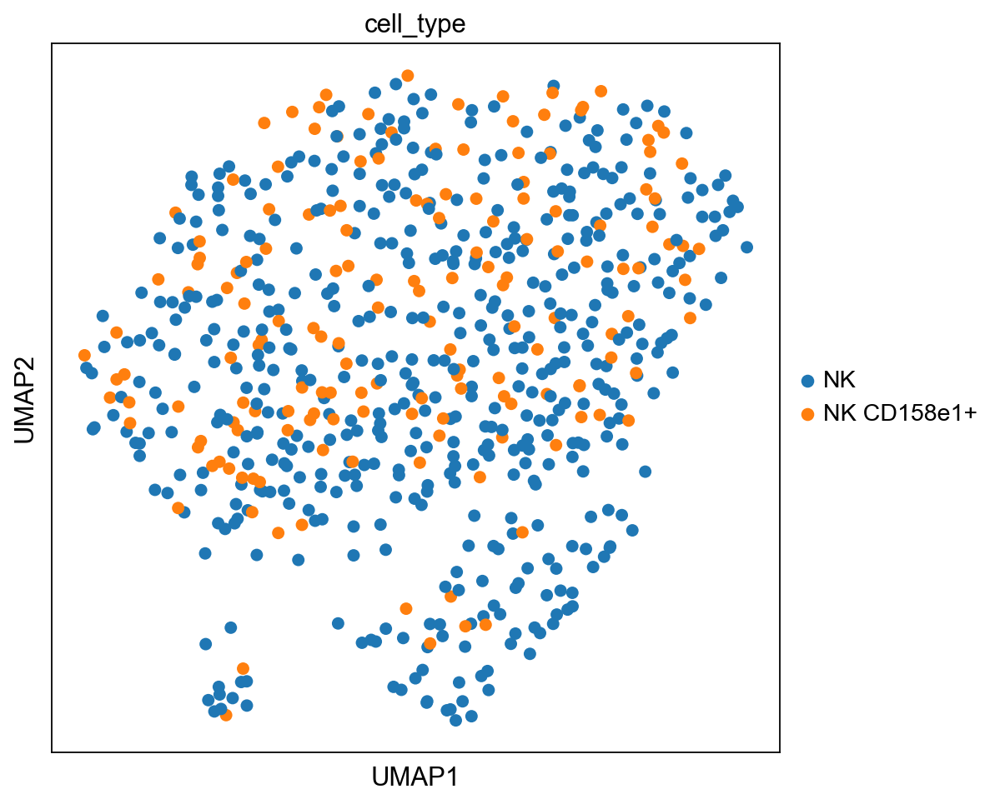

ILC, high expression, RNA


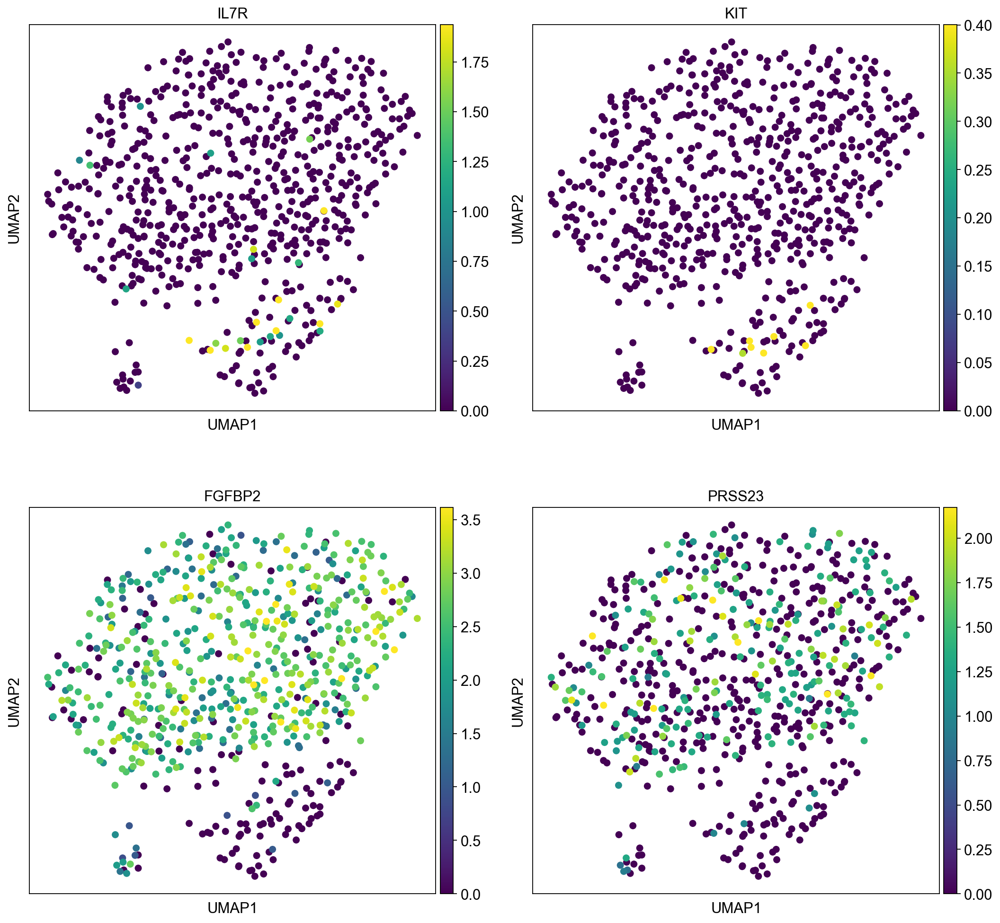

ILC, low expression


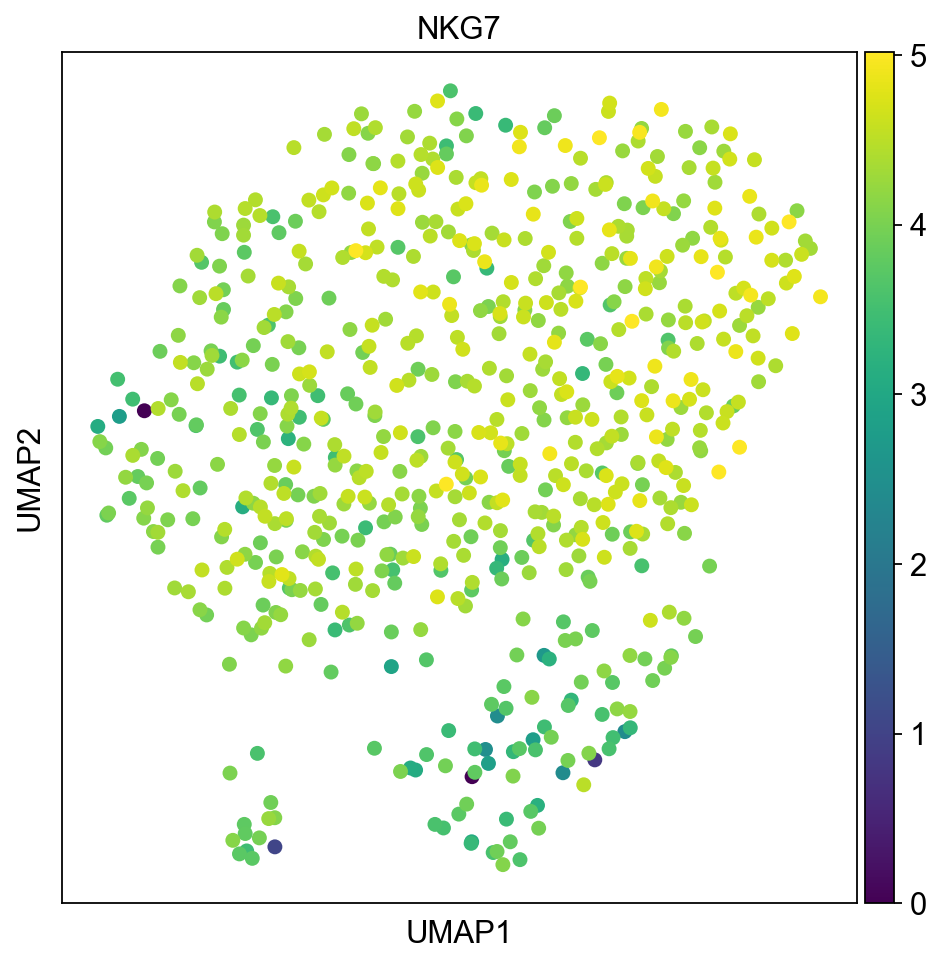

In [24]:
ILC_mels_high = ['IL7R', 'KIT', 'FGFBP2', 'PRSS23'] 
ILC_mels_low = ['NKG7']

#KIT = CD117 (not included in antibody panel)

sc.set_figure_params(figsize=(7, 7))

sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#RNA
print("ILC, high expression, RNA")
sc.pl.umap(sample_nk, color = ILC_mels_high, vmax="p99", color_map = 'viridis', ncols=2)

print("ILC, low expression")
sc.pl.umap(sample_nk, color = ILC_mels_low, vmax="p99", color_map = 'viridis', ncols=2)



## 4. Proliferating NK cells (cluster 6 in the paper)

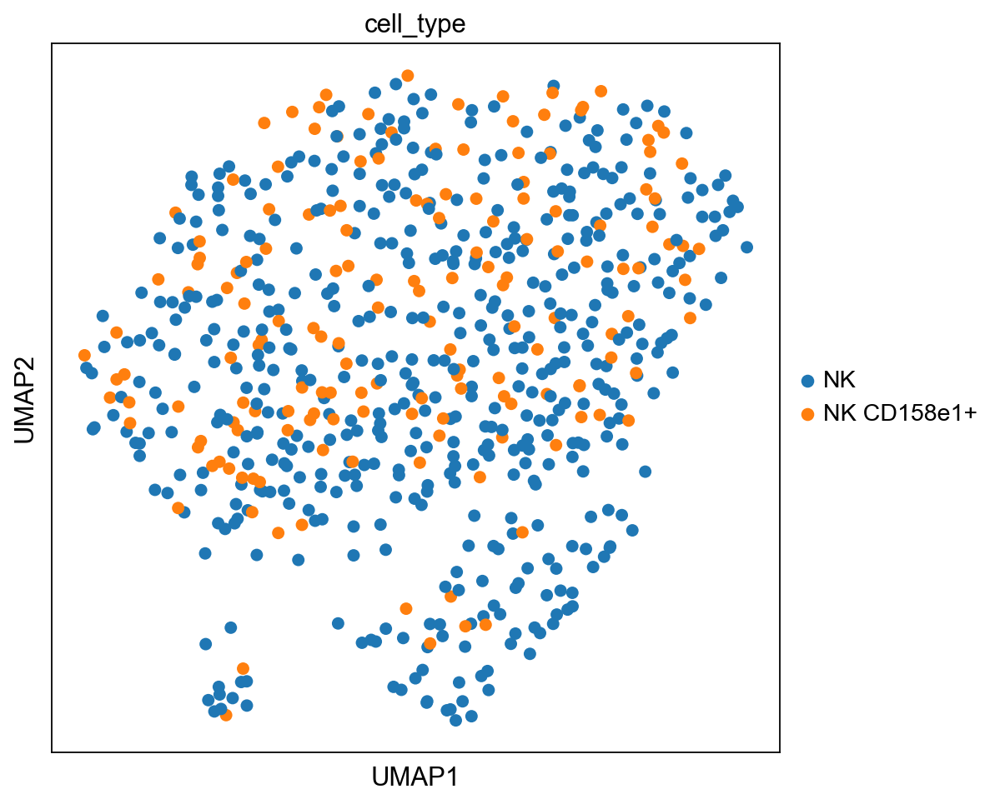

Proliferating NK cells, high expression, RNA


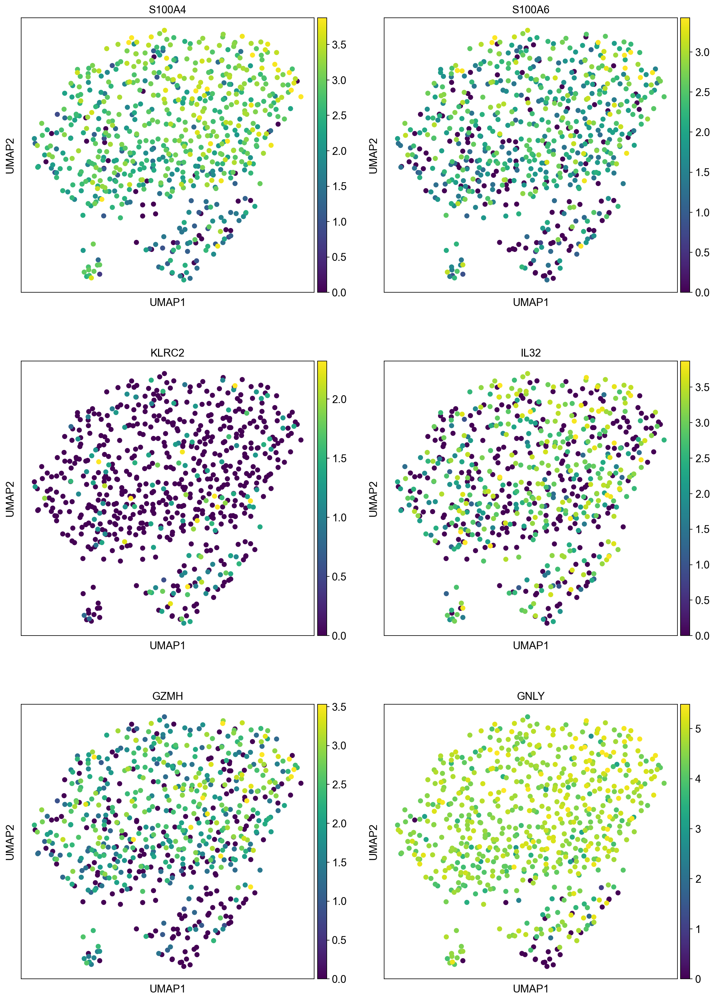

Proliferating NK cells, low expression, RNA


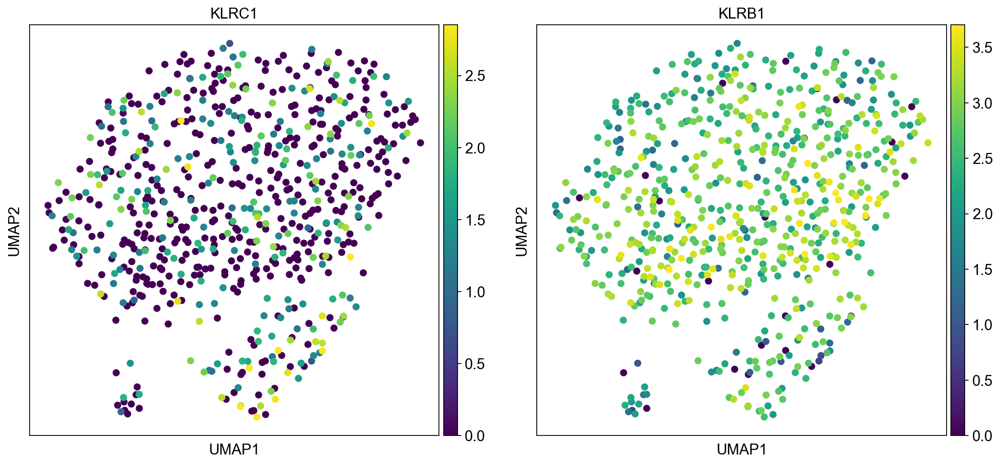

In [25]:
prolif_high = ['S100A4', 'S100A6', 'KLRC2', 'IL32', 'GZMH', 'GNLY']
prolif_low = ['KLRC1', 'KLRB1']

#CD161 and CD160 ab not included in Neurips panel

sc.set_figure_params(figsize=(7, 7))
sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

print("Proliferating NK cells, high expression, RNA")

sc.pl.umap(sample_nk, color = prolif_high, vmax="p99", color_map = 'viridis', ncols=2)

print("Proliferating NK cells, low expression, RNA")
sc.pl.umap(sample_nk, color = prolif_low, vmax="p99", color_map = 'viridis', ncols=2)

## 5. CD56dim NK cells with reduced effector function (cluster 8 in the paper)

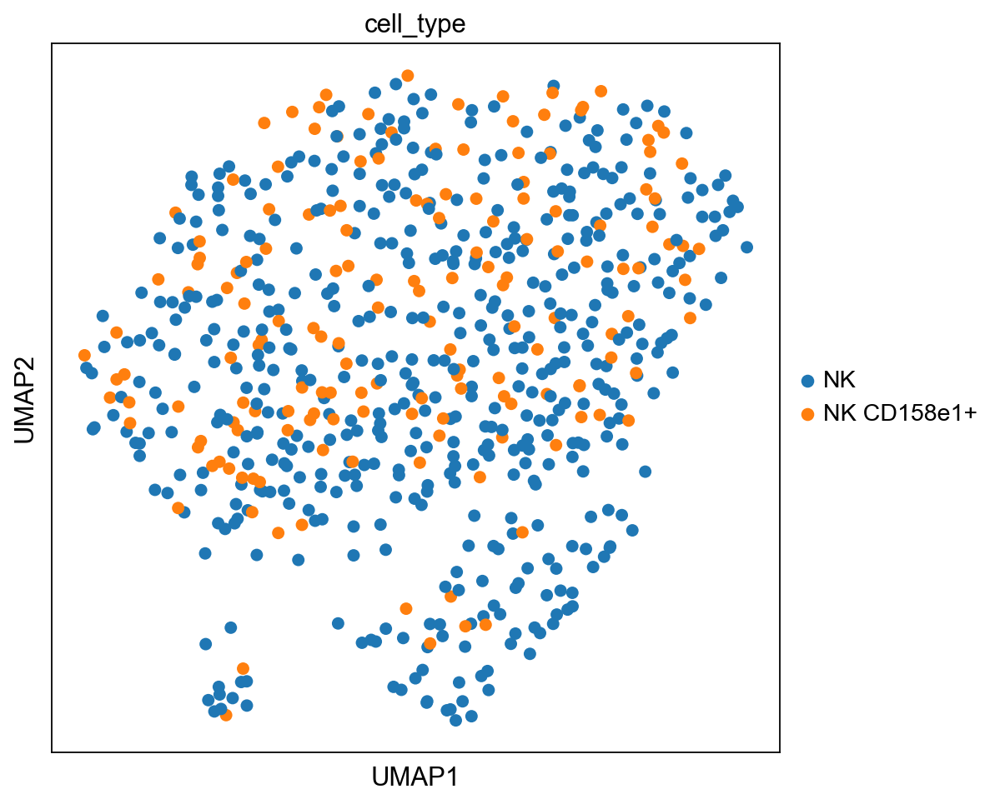

NK cells with reduced effector function, high expression, RNA


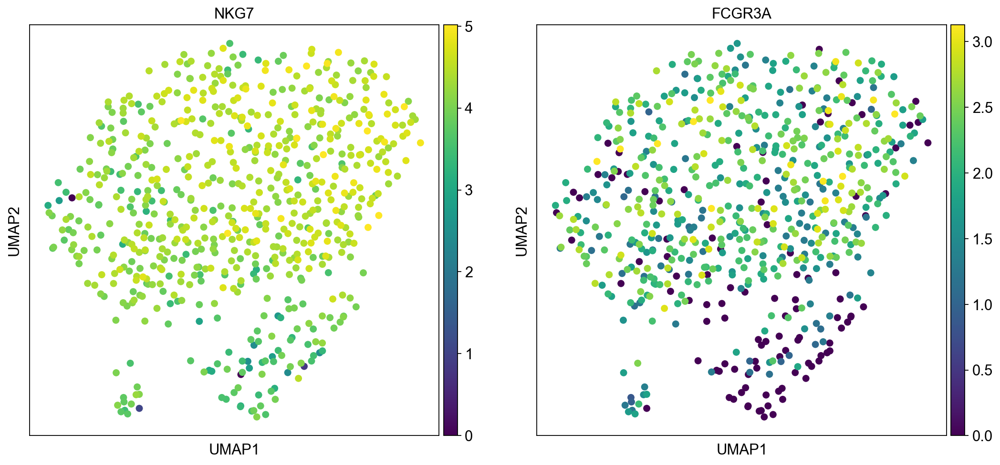

NK cells with reduced effector function, low expression, RNA


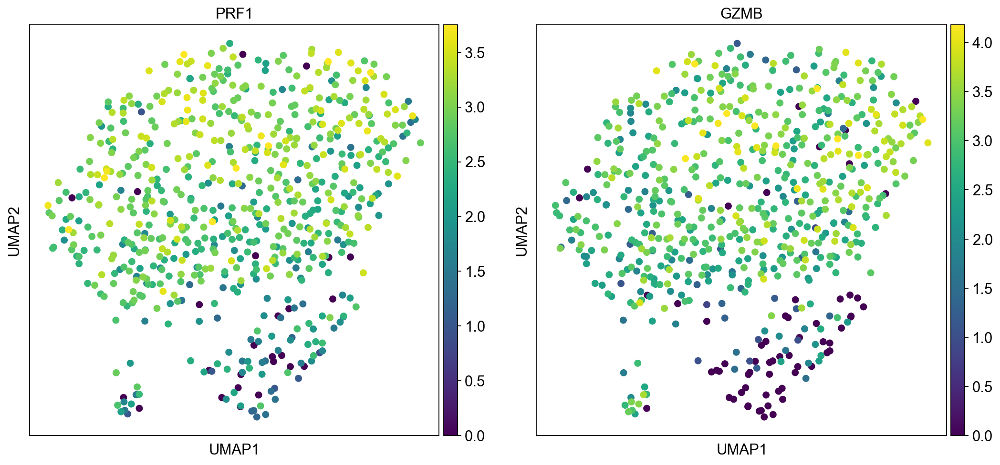

NK cells with reduced effector function, high, protein


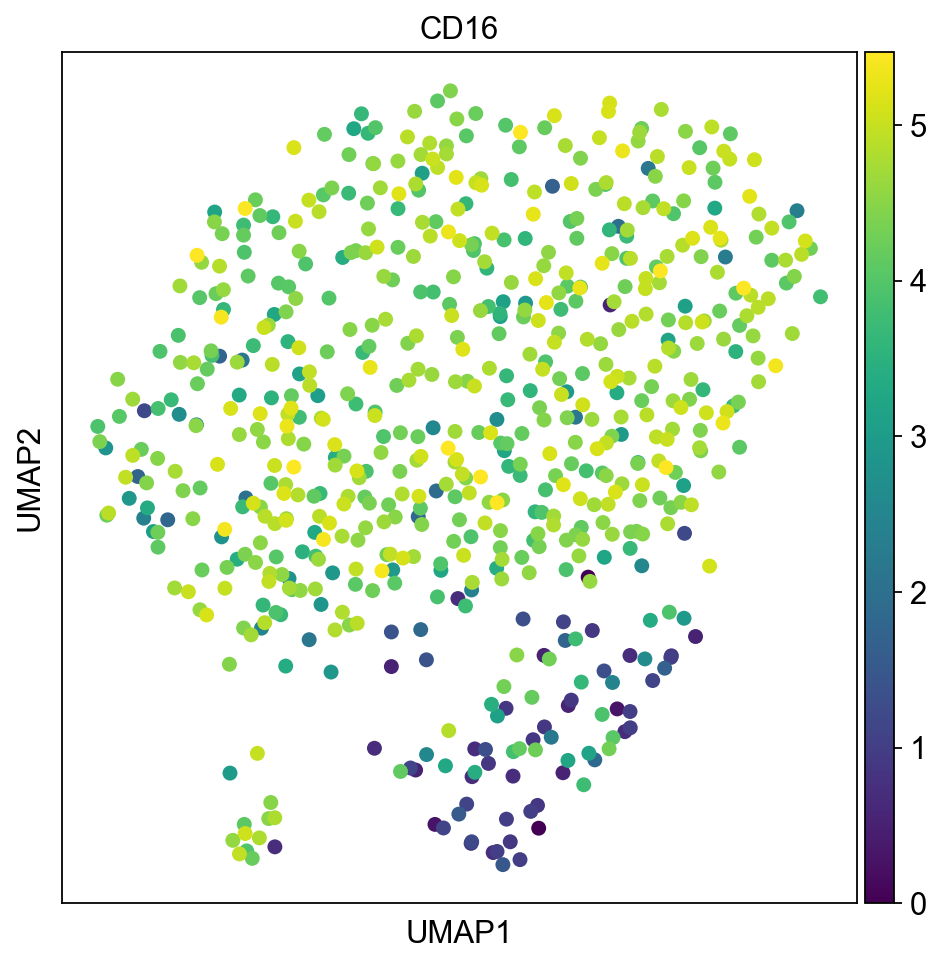

NK cells with reduced effector function, low, protein


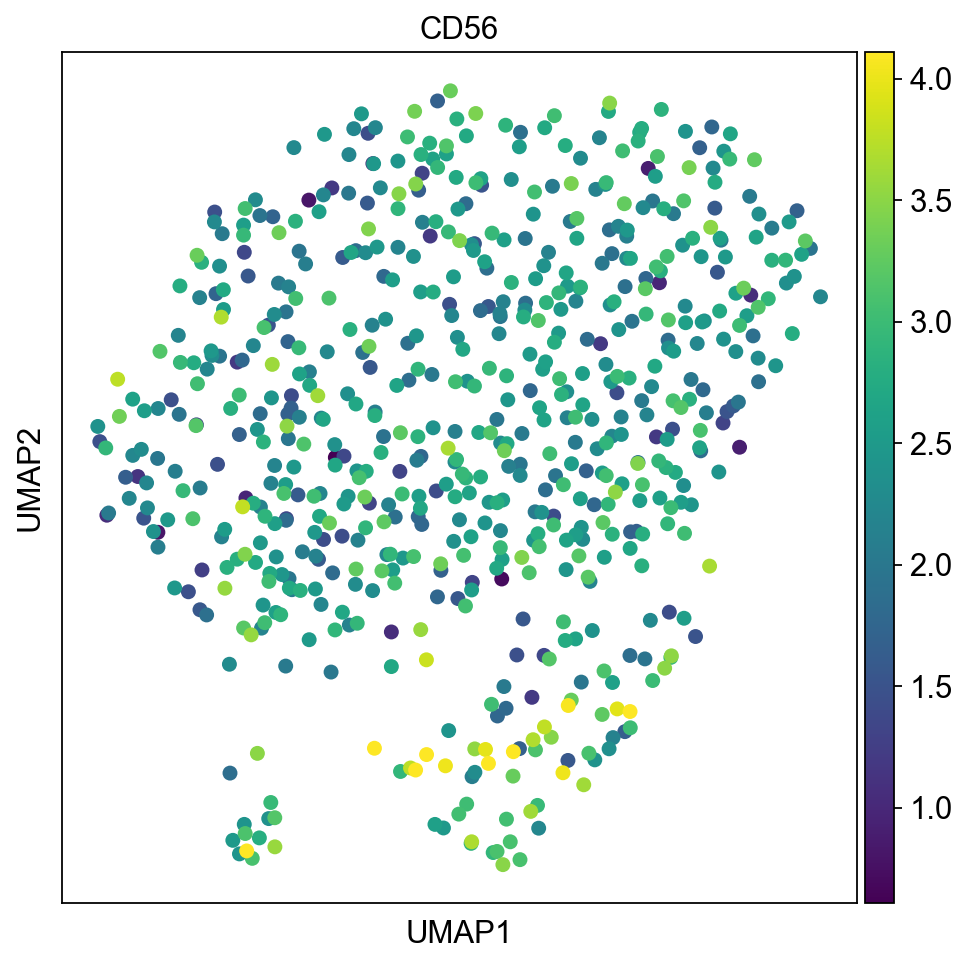

In [26]:
# CD56dim cells with reduced effector function, cluster 8 in the paper

red_eff_high = ['NKG7', 'FCGR3A']
red_eff_low = ['PRF1', 'GZMB']

red_eff_high_prot = ['CD16']
red_eff_low_prot = ['CD56']


sc.pl.umap(sample_nk, color = ['cell_type'], color_map = 'viridis')

#RNA
print("NK cells with reduced effector function, high expression, RNA")
sc.pl.umap(sample_nk, color = red_eff_high , vmax="p99", color_map = 'viridis', ncols=2)

print("NK cells with reduced effector function, low expression, RNA")
sc.pl.umap(sample_nk, color = red_eff_low , vmax="p99", color_map = 'viridis', ncols=2)

print("NK cells with reduced effector function, high, protein")
sc.pl.umap(sample_nk, color = red_eff_high_prot , vmax="p99", color_map = 'viridis', ncols=2)

print("NK cells with reduced effector function, low, protein")
sc.pl.umap(sample_nk, color = red_eff_low_prot , vmax="p99", color_map = 'viridis', ncols=2)





## 6.  Precursors (cluster 3 in the paper)

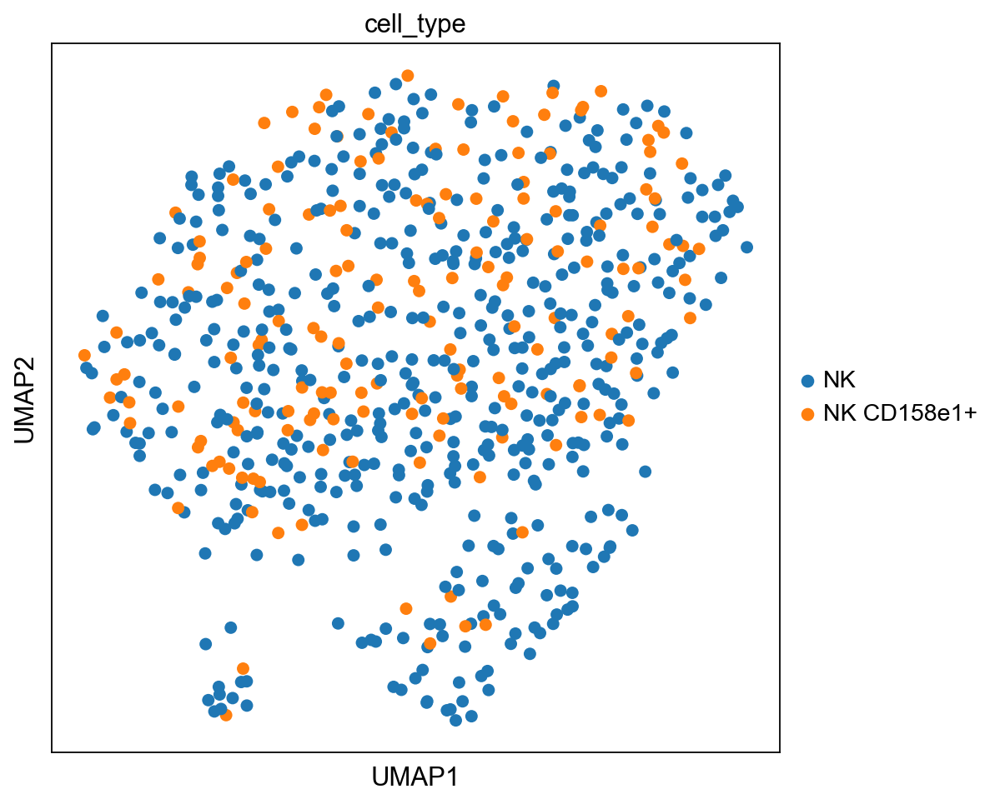

Progenitor NK cells, RNA


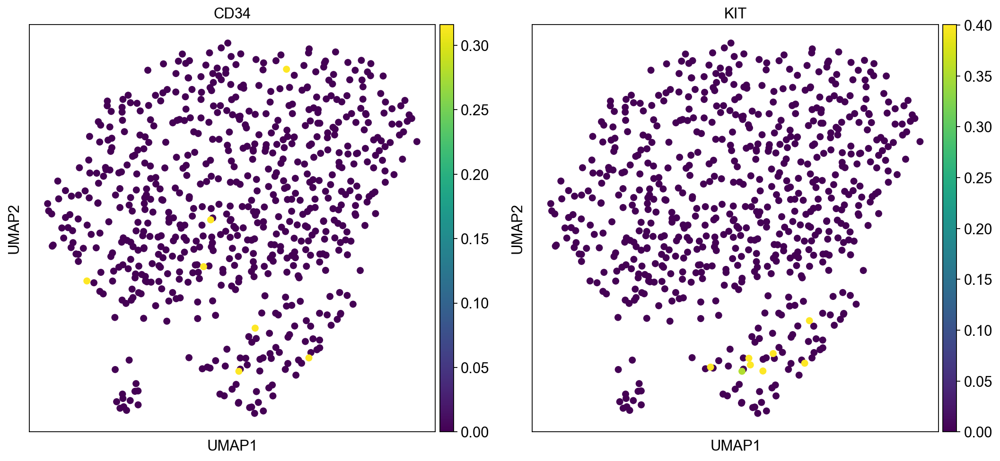

Progenitor NK cells, protein


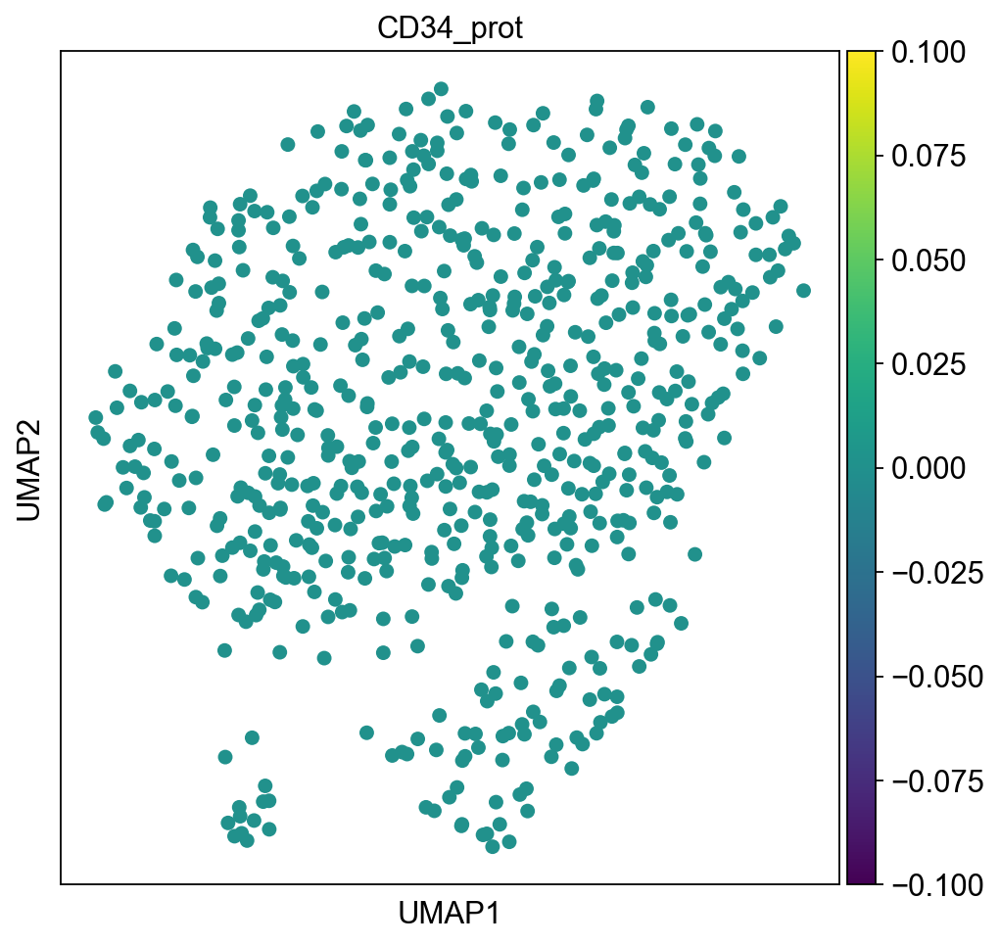

In [27]:

clust3_mels = ['CD34', 'KIT']
clust3_mels_prot = ['CD34_prot'] #CD117 not used in Neurips ab panel

sc.pl.umap(sample_nk, color = ['cell_type'] , vmax="p99", color_map = 'viridis', ncols=2)

print("Progenitor NK cells, RNA")
sc.pl.umap(sample_nk, color = clust3_mels , vmax="p99", color_map = 'viridis', ncols=2)

print("Progenitor NK cells, protein")
sc.pl.umap(sample_nk, color = clust3_mels_prot , vmax="p99", color_map = 'viridis', ncols=2)




## Markers from pseudotime analysis

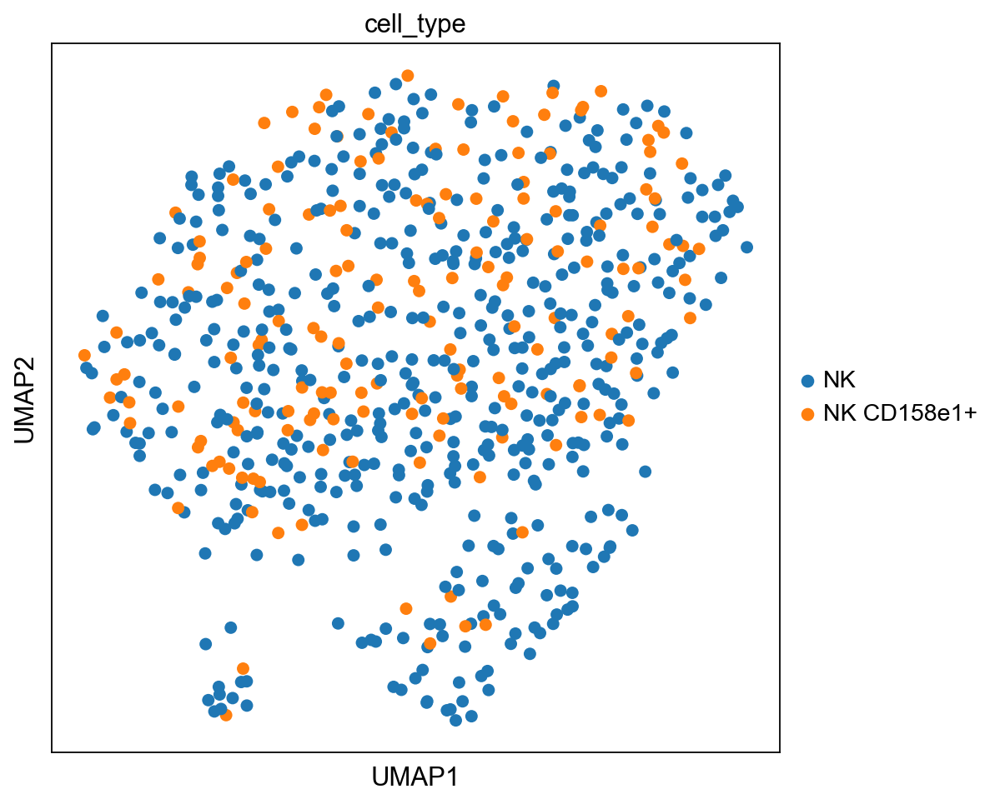

Pseudotime analysis, RNA


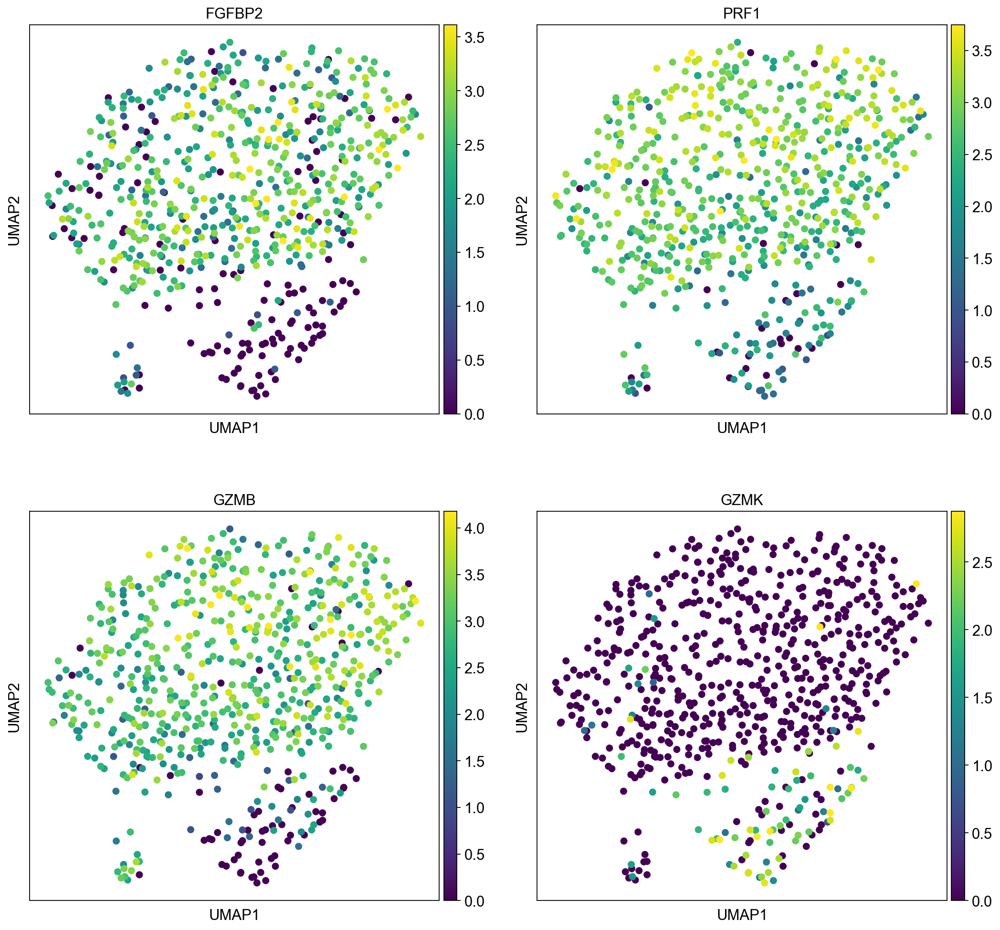

In [28]:
pseudo_mels = ['FGFBP2', 'PRF1', 'GZMB', 'GZMK']
#only RNA markers

sc.pl.umap(sample_nk, color = ['cell_type'] , vmax="p99", color_map = 'viridis', ncols=2)


print('Pseudotime analysis, RNA')

sc.pl.umap(sample_nk, color = pseudo_mels , vmax="p99", color_map = 'viridis', ncols=2)

